In [87]:
# !pip install seaborn
# !pip install missingno
# !pip install xgboost
# !pip install catboost
# !pip install regex
# !pip install sklearn
# !pip install pandas
# !pip install numpy
# !pip install imblearn
# !pip install lightgbm

In [88]:
import pandas as pd   # data processing, CSV file I/O (e.g. pd.read_csv)
import numpy as np   # linear algebra
import matplotlib.pyplot as plt  #graphs and plots
import seaborn as sns   #data visualizations
import csv # Some extra functionalities for csv  files - reading it as a dictionary
from lightgbm import LGBMClassifier #sklearn is for machine learning and statistical modeling including classification, regression, clustering and dimensionality reduction

from sklearn.model_selection import train_test_split, cross_validate   #break up dataset into train and test sets

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import StandardScaler, MinMaxScaler


# importing python library for working with missing data
import missingno as msno
# To install missingno use: !pip install missingno
import re    # This library is used to perform regex pattern matching

# import various functions from sklearn
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import LinearSVC
from sklearn.ensemble import GradientBoostingClassifier
from catboost import CatBoostClassifier
import xgboost as xgb
from sklearn.metrics import roc_auc_score, accuracy_score, precision_score, recall_score, classification_report, make_scorer
from sklearn.linear_model import SGDClassifier
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, train_test_split

In [89]:
# from sklearn.model_selection import KFold,cross_val_score, RepeatedStratifiedKFold,StratifiedKFold
# from sklearn.impute import SimpleImputer
# from sklearn.pipeline import Pipeline
# from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
# from sklearn.preprocessing import OneHotEncoder,StandardScaler,PowerTransformer
# from sklearn.compose import ColumnTransformer
# from sklearn.pipeline import Pipeline
# from sklearn.impute import KNNImputer,SimpleImputer
# from sklearn.compose import make_column_transformer
# from imblearn.pipeline import make_pipeline
# from sklearn.svm import SVC
# from sklearn.impute import SimpleImputer
# from sklearn.dummy import DummyClassifier
# from imblearn.over_sampling import SMOTE
# from sklearn.neighbors import KNeighborsClassifier
# from sklearn.metrics import confusion_matrix, accuracy_score, balanced_accuracy_score,\
#                             precision_score, recall_score, roc_auc_score,\
#                             plot_confusion_matrix, classification_report, plot_roc_curve, f1_score

In [90]:
import plotly
import plotly.express as px
import plotly.graph_objs as go
import plotly.offline as py
from plotly.offline import iplot
from plotly.subplots import make_subplots
import plotly.figure_factory as ff

In [91]:
import warnings
warnings.filterwarnings('ignore')

In [92]:
# Functions for later use
def missing (diabetes):
    missing_number = diabetes.isnull().sum().sort_values(ascending=False)
    missing_percent = round(((diabetes.isnull().sum()/diabetes.isnull().count())* 100), 2).sort_values(ascending=False)
    missing_values = pd.concat([missing_number, missing_percent], axis=1, keys=['Missing_Number', 'Missing_Percent'])
    return missing_values

In [279]:
path = '/Users/dannychen/Desktop/ahi_grad_school/AHI_spring_2025/diabetes_ml_project/diabetic_data.csv'
diabetes = pd.read_csv(path)

# Check how the data appears
diabetes

,encounter_id,patient_nbr,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,...,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
0,2278392,8222157,Caucasian,Female,[0-10),?,6,25,1,1,...,No,No,No,No,No,No,No,No,No,NO
1,149190,55629189,Caucasian,Female,[10-20),?,1,1,7,3,...,No,Up,No,No,No,No,No,Ch,Yes,>30
2,64410,86047875,AfricanAmerican,Female,[20-30),?,1,1,7,2,...,No,No,No,No,No,No,No,No,Yes,NO
3,500364,82442376,Caucasian,Male,[30-40),?,1,1,7,2,...,No,Up,No,No,No,No,No,Ch,Yes,NO
4,16680,42519267,Caucasian,Male,[40-50),?,1,1,7,1,...,No,Steady,No,No,No,No,No,Ch,Yes,NO
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
101761,443847548,100162476,AfricanAmerican,Male,[70-80),?,1,3,7,3,...,No,Down,No,No,No,No,No,Ch,Yes,>30
101762,443847782,74694222,AfricanAmerican,Female,[80-90),?,1,4,5,5,...,No,Steady,No,No,No,No,No,No,Yes,NO
101763,443854148,41088789,Caucasian,Male,[70-80),?,1,1,7,1,...,No,Down,No,No,No,No,No,Ch,Yes,NO
101764,443857166,31693671,Caucasian,Female,[80-90),?,2,3,7,10,...,No,Up,No,No,No,No,No,Ch,Yes,NO


In [280]:
diabetes.columns

Index(['encounter_id', 'patient_nbr', 'race', 'gender', 'age', 'weight',
       'admission_type_id', 'discharge_disposition_id', 'admission_source_id',
       'time_in_hospital', 'payer_code', 'medical_specialty',
       'num_lab_procedures', 'num_procedures', 'num_medications',
       'number_outpatient', 'number_emergency', 'number_inpatient', 'diag_1',
       'diag_2', 'diag_3', 'number_diagnoses', 'max_glu_serum', 'A1Cresult',
       'metformin', 'repaglinide', 'nateglinide', 'chlorpropamide',
       'glimepiride', 'acetohexamide', 'glipizide', 'glyburide', 'tolbutamide',
       'pioglitazone', 'rosiglitazone', 'acarbose', 'miglitol', 'troglitazone',
       'tolazamide', 'examide', 'citoglipton', 'insulin',
       'glyburide-metformin', 'glipizide-metformin',
       'glimepiride-pioglitazone', 'metformin-rosiglitazone',
       'metformin-pioglitazone', 'change', 'diabetesMed', 'readmitted'],
      dtype='object')

# **GOAL**: Identify which data elements has the highest probability of readmitting WITHIN 30 days

# 1) Insights into Target Variable
## Exploratory Data Analysis (EDA) --> WILL FINISH LATER

In [283]:
diabetes['readmitted'].value_counts(normalize=True)

readmitted
NO     0.539119
>30    0.349282
<30    0.111599
Name: proportion, dtype: float64

In [284]:
# Look at what our target y-value looks like
y = diabetes['readmitted']

print('Percentage of Readmission')
print(f'Never readmitted (NO):           {round(y.value_counts(normalize=True)[0]*100,2)}% ({y.value_counts()[0]} patients)')
print(f'Readmitted after 30 days (>30):  {round(y.value_counts(normalize=True)[1]*100,2)}% ({y.value_counts()[1]} patients)')
print(f'Readmitted within 30 days (<30): {round(y.value_counts(normalize=True)[2]*100,2)}% ({y.value_counts()[2]} patients)')

Percentage of Readmission
Never readmitted (NO):           53.91% (54864 patients)
Readmitted after 30 days (>30):  34.93% (35545 patients)
Readmitted within 30 days (<30): 11.16% (11357 patients)


The goal of this analysis is to **identify which data elements has the highest probability of readmitting WITHIN 30 days**. As such, those with no readmission at all (NO) and those readmitted after 30 days can be combined.

In [286]:
# Look at what our target y-value looks like
y = diabetes['readmitted']

print('Revised Percentage of Readmission')
print(f'Late or no readmission (>30): {round((y.value_counts(normalize=True)[0] + y.value_counts(normalize=True)[1])*100,2)}% ({y.value_counts()[0] + y.value_counts()[1]} patients)')
print(f'Early readmission (<30):    {round(y.value_counts(normalize=True)[2]*100,2)}% ({y.value_counts()[2]} patients)')

Revised Percentage of Readmission
Late or no readmission (>30): 88.84% (90409 patients)
Early readmission (<30):    11.16% (11357 patients)


## Imbalance Exist Above
There is a heavy imbalance toward patients who have late or no admissions. 
* 90409 (~89%) of patients had late or no readmission
* 11357 (~11%) of patient were readmitted within 30 days

There are 8 times more patients who had late or no readmission than those who were readmitted within 30 days.

In [288]:
fig = px.histogram(diabetes, x='readmitted', title='Patient Readmission', width=400, height=400)
fig.show()

## Regarding Metrics
* Accuracy will NOT be used since it does not do well in imbalanced dataset
* Combining NO and >30 together leaves us with two outcomes: Readmission within 30 days + Readmission after 30 days or no readmissions. THUS, this becomes a binary classification problem.
* Since there is data imbalance and our target variable is skewed, **Area Under the ROC Curve (AUC)** or **recall** may be the more ideal metrics. AUC combines precision and recall while recall itself focuses on identifying cases that are actually positive—-high risk of readmission within 30 days, which is what we want.

In [290]:
diabetes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 101766 entries, 0 to 101765
Data columns (total 50 columns):
 #   Column                    Non-Null Count   Dtype 
---  ------                    --------------   ----- 
 0   encounter_id              101766 non-null  int64 
 1   patient_nbr               101766 non-null  int64 
 2   race                      101766 non-null  object
 3   gender                    101766 non-null  object
 4   age                       101766 non-null  object
 5   weight                    101766 non-null  object
 6   admission_type_id         101766 non-null  int64 
 7   discharge_disposition_id  101766 non-null  int64 
 8   admission_source_id       101766 non-null  int64 
 9   time_in_hospital          101766 non-null  int64 
 10  payer_code                101766 non-null  object
 11  medical_specialty         101766 non-null  object
 12  num_lab_procedures        101766 non-null  int64 
 13  num_procedures            101766 non-null  int64 
 14  num_

## Check for Missing Data / Missing Values (NaN)

In [292]:
# Get NaN
missing(diabetes)

,Missing_Number,Missing_Percent
max_glu_serum,96420,94.75
A1Cresult,84748,83.28
encounter_id,0,0.00
nateglinide,0,0.00
glimepiride,0,0.00
acetohexamide,0,0.00
glipizide,0,0.00
glyburide,0,0.00
tolbutamide,0,0.00
pioglitazone,0,0.00


<Axes: >

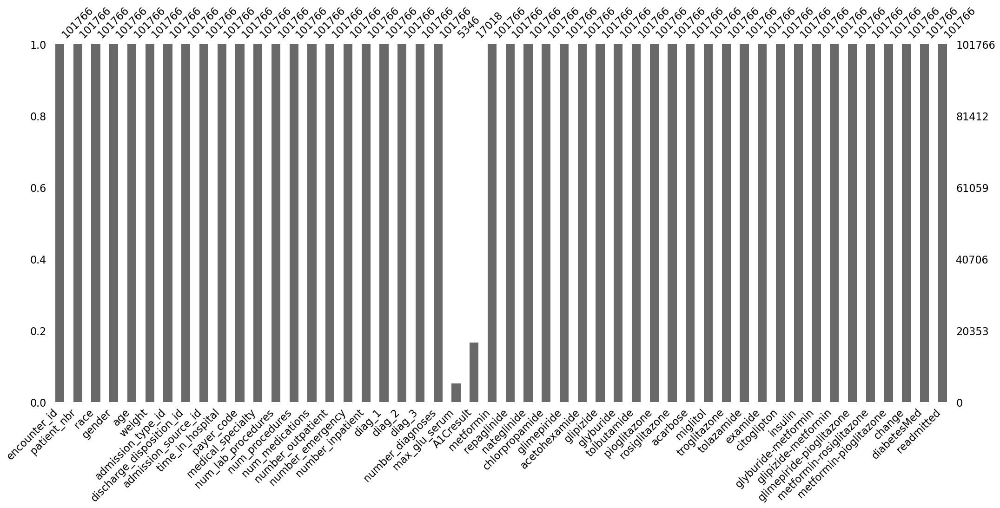

In [293]:
# Visualize missing data to get better idea
msno.bar(diabetes)

In [294]:
# Get any missing values that were not detected as such
diabetes.columns[diabetes.isin(['?','Unknown/Invalid']).any()].tolist()

['race',
 'gender',
 'weight',
 'payer_code',
 'medical_specialty',
 'diag_1',
 'diag_2',
 'diag_3']

## Numerical and Categorical Variables

In [296]:
# encounter_id + patient_nbr excluded b/c irrelevant
# admission_type_id, discharge_disposition_id, and admission_source_id are numeric categories, so they are not included in the numerical array
numerical = [
    'time_in_hospital', 'num_lab_procedures', 'num_procedures',
    'num_medications', 'number_outpatient', 'number_emergency',
    'number_inpatient', 'number_diagnoses'
]

categorical = [
    'race', 'gender', 'age', 'weight', 'payer_code', 'medical_specialty',
    'diag_1', 'diag_2', 'diag_3', 'max_glu_serum', 'A1Cresult',
    'metformin', 'repaglinide', 'nateglinide', 'chlorpropamide', 
    'glimepiride', 'acetohexamide', 'glipizide', 'glyburide', 
    'tolbutamide', 'pioglitazone', 'rosiglitazone', 'acarbose',
    'miglitol', 'troglitazone', 'tolazamide', 'examide', 'citoglipton',
    'insulin', 'glyburide-metformin', 'glipizide-metformin', 
    'glimepiride-pioglitazone', 'metformin-rosiglitazone', 
    'metformin-pioglitazone', 'change', 'readmitted', 'readmitted'
]

In [297]:
diabetes[numerical].describe()

,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses
count,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000
mean,4.395987,43.095641,1.339730,16.021844,0.369357,0.197836,0.635566,7.422607
std,2.985108,19.674362,1.705807,8.127566,1.267265,0.930472,1.262863,1.933600
min,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000
25%,2.000000,31.000000,0.000000,10.000000,0.000000,0.000000,0.000000,6.000000
50%,4.000000,44.000000,1.000000,15.000000,0.000000,0.000000,0.000000,8.000000
75%,6.000000,57.000000,2.000000,20.000000,0.000000,0.000000,1.000000,9.000000
max,14.000000,132.000000,6.000000,81.000000,42.000000,76.000000,21.000000,16.000000


## Skewness

In [299]:
diabetes[numerical].skew()

time_in_hospital       1.133999
num_lab_procedures    -0.236544
num_procedures         1.316415
num_medications        1.326672
number_outpatient      8.832959
number_emergency      22.855582
number_inpatient       3.614139
number_diagnoses      -0.876746
dtype: float64

Fairly Symmetric / Slightly Skewed  
* num_lab_procedures (slightly left-skewed)

Moderately Left-Skewed  
* number_diagnoses

Moderately Right-Skewed  
* admission_source_id  
* admission_type_id  
* time_in_hospital  
* num_procedures  
* num_medications

Highly Right-Skewed  
* discharge_disposition_id  
* number_inpatient

Extremely Right-Skewed  
* number_outpatient  
* number_emergency
  
**The majority of values are right-skewed**

## Univariate Analysis

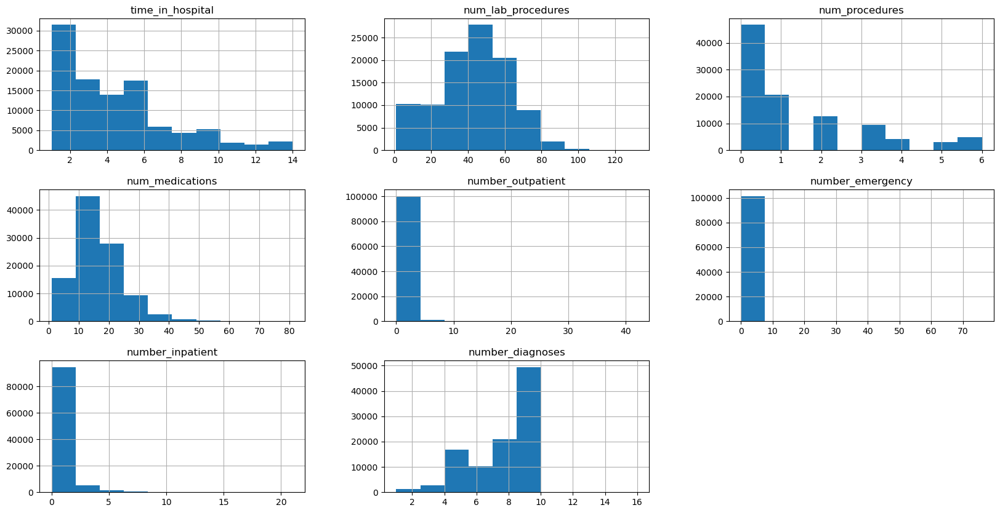

In [302]:
diabetes[numerical].hist(figsize=(20,10));

In [303]:
# DELETE LATER: Just here for easier reference
diabetes.columns

Index(['encounter_id', 'patient_nbr', 'race', 'gender', 'age', 'weight',
       'admission_type_id', 'discharge_disposition_id', 'admission_source_id',
       'time_in_hospital', 'payer_code', 'medical_specialty',
       'num_lab_procedures', 'num_procedures', 'num_medications',
       'number_outpatient', 'number_emergency', 'number_inpatient', 'diag_1',
       'diag_2', 'diag_3', 'number_diagnoses', 'max_glu_serum', 'A1Cresult',
       'metformin', 'repaglinide', 'nateglinide', 'chlorpropamide',
       'glimepiride', 'acetohexamide', 'glipizide', 'glyburide', 'tolbutamide',
       'pioglitazone', 'rosiglitazone', 'acarbose', 'miglitol', 'troglitazone',
       'tolazamide', 'examide', 'citoglipton', 'insulin',
       'glyburide-metformin', 'glipizide-metformin',
       'glimepiride-pioglitazone', 'metformin-rosiglitazone',
       'metformin-pioglitazone', 'change', 'diabetesMed', 'readmitted'],
      dtype='object')

## Categorical Features to Visualize
* race
* gender
* age
* diabetesMed

RACE

In [306]:
print (f'{round(diabetes['race'].value_counts(normalize=True)*100,2)}')
fig = px.histogram(diabetes, x='race', title='Race', width=500, height=500)
fig.show()

race
Caucasian          74.78
AfricanAmerican    18.88
?                   2.23
Hispanic            2.00
Other               1.48
Asian               0.63
Name: proportion, dtype: float64


GENDER

In [308]:
print (f'{round(diabetes['gender'].value_counts(normalize=True)*100,2)}')
fig = px.histogram(diabetes, x='gender', title='Gender', width=500, height=500)
fig.show()

gender
Female             53.76
Male               46.24
Unknown/Invalid     0.00
Name: proportion, dtype: float64


AGE

In [310]:
print (f'{round(diabetes['age'].value_counts(normalize=True)*100,2)}')
fig = px.histogram(diabetes, x='age', title='age', width=500, height=500)
fig.show()

age
[70-80)     25.62
[60-70)     22.09
[50-60)     16.96
[80-90)     16.90
[40-50)      9.52
[30-40)      3.71
[90-100)     2.74
[20-30)      1.63
[10-20)      0.68
[0-10)       0.16
Name: proportion, dtype: float64


DIABETESMED

In [312]:
print (f'{round(diabetes['diabetesMed'].value_counts(normalize=True)*100,2)}')
fig = px.histogram(diabetes, x='diabetesMed', title='diabetesMed', width=500, height=500)
fig.show()

diabetesMed
Yes    77.0
No     23.0
Name: proportion, dtype: float64


### CHECKPOINT --> WILL FINISH EDA LATER 

### Bivariate Analysis

In [315]:
# print (f'A patient taking diabete medicine has a probability of {round(diabetes[diabetes['diabetesMed'] == 'Yes']['readmitted'].mean()*100, 2)}% to be readmitted')

# print()

# print (f'A patient NOT taking diabetes medicine has a probability of {round(diabetes[diabetes['diabetesMed'] == 'No']['readmitted'].mean()*100, 2)}% to be readmitted')

# 2) Cleaning Data

In [317]:
diabetes.columns

Index(['encounter_id', 'patient_nbr', 'race', 'gender', 'age', 'weight',
       'admission_type_id', 'discharge_disposition_id', 'admission_source_id',
       'time_in_hospital', 'payer_code', 'medical_specialty',
       'num_lab_procedures', 'num_procedures', 'num_medications',
       'number_outpatient', 'number_emergency', 'number_inpatient', 'diag_1',
       'diag_2', 'diag_3', 'number_diagnoses', 'max_glu_serum', 'A1Cresult',
       'metformin', 'repaglinide', 'nateglinide', 'chlorpropamide',
       'glimepiride', 'acetohexamide', 'glipizide', 'glyburide', 'tolbutamide',
       'pioglitazone', 'rosiglitazone', 'acarbose', 'miglitol', 'troglitazone',
       'tolazamide', 'examide', 'citoglipton', 'insulin',
       'glyburide-metformin', 'glipizide-metformin',
       'glimepiride-pioglitazone', 'metformin-rosiglitazone',
       'metformin-pioglitazone', 'change', 'diabetesMed', 'readmitted'],
      dtype='object')

In [318]:
# Prep
numerical = [
    'time_in_hospital', 
    'num_lab_procedures', 
    'num_procedures',
    'number_outpatient', 
    'number_emergency',
    'number_inpatient', 
]

### Step 1: Drop unnecessary columns

In [320]:
columns_to_drop = [
    'encounter_id', 
    'patient_nbr', 
    'diag_1', 
    'diag_2', 
    'diag_3', 
    'max_glu_serum', 
    'num_medications', 
    'number_diagnoses'
]

# diabetes.drop(['weight', 'medical_specialty'], axis = 1, inplace = True)

diabetes.drop(columns_to_drop, axis = 1, inplace = True)

| Column(s)                        | Reason for Dropping                                                       |
|----------------------------------|---------------------------------------------------------------------------|
| `encounter_id`, `patient_nbr`    | Not relevant and contains PHI                                             |
| `diag_1`, `diag_2`, `diag_3`     | Instructed not to work with these for this project                        |
| `max_glu_serum`                  | Too many missing values                                                   |
| `num_medications`, `number_diagnoses` | Dropping these improved AUC  

### Step 2: Check for duplicates or "dups"

In [323]:
diabetes.duplicated().sum()

193

In [324]:
# There are some duplicates, so let's drop them
diabetes = diabetes.drop_duplicates()

# Verify there are no more duplicates
diabetes.duplicated().sum()

0

### Step 3: Check for missing data

In [326]:
diabetes.info()

<class 'pandas.core.frame.DataFrame'>
Index: 101573 entries, 0 to 101765
Data columns (total 40 columns):
 #   Column                    Non-Null Count   Dtype 
---  ------                    --------------   ----- 
 0   race                      101573 non-null  object
 1   gender                    101573 non-null  object
 2   age                       101573 non-null  object
 3   admission_type_id         101573 non-null  int64 
 4   discharge_disposition_id  101573 non-null  int64 
 5   admission_source_id       101573 non-null  int64 
 6   time_in_hospital          101573 non-null  int64 
 7   payer_code                101573 non-null  object
 8   num_lab_procedures        101573 non-null  int64 
 9   num_procedures            101573 non-null  int64 
 10  number_outpatient         101573 non-null  int64 
 11  number_emergency          101573 non-null  int64 
 12  number_inpatient          101573 non-null  int64 
 13  A1Cresult                 17007 non-null   object
 14  metformin

In [327]:
diabetes.isna().sum()

race                            0
gender                          0
age                             0
admission_type_id               0
discharge_disposition_id        0
admission_source_id             0
time_in_hospital                0
payer_code                      0
num_lab_procedures              0
num_procedures                  0
number_outpatient               0
number_emergency                0
number_inpatient                0
A1Cresult                   84566
metformin                       0
repaglinide                     0
nateglinide                     0
chlorpropamide                  0
glimepiride                     0
acetohexamide                   0
glipizide                       0
glyburide                       0
tolbutamide                     0
pioglitazone                    0
rosiglitazone                   0
acarbose                        0
miglitol                        0
troglitazone                    0
tolazamide                      0
examide       

There is no more detectable missing (NaN) data. However, missing data could be labeled as other things like ?, unknown, and invalid, which goes undetected. 

Going through all columns' unique values could help find those.

In [329]:
for i, column_name in enumerate(diabetes.columns):
    print(f'{i}) {column_name}: {diabetes[column_name].unique()}')

0) race: ['Caucasian' 'AfricanAmerican' '?' 'Other' 'Asian' 'Hispanic']
1) gender: ['Female' 'Male' 'Unknown/Invalid']
2) age: ['[0-10)' '[10-20)' '[20-30)' '[30-40)' '[40-50)' '[50-60)' '[60-70)'
 '[70-80)' '[80-90)' '[90-100)']
3) admission_type_id: [6 1 2 3 4 5 8 7]
4) discharge_disposition_id: [25  1  3  6  2  5 11  7 10  4 14 18  8 13 12 16 17 22 23  9 20 15 24 28
 19 27]
5) admission_source_id: [ 1  7  2  4  5  6 20  3 17  8  9 14 10 22 11 25 13]
6) time_in_hospital: [ 1  3  2  4  5 13 12  9  7 10  6 11  8 14]
7) payer_code: ['?' 'MC' 'MD' 'HM' 'UN' 'BC' 'SP' 'CP' 'SI' 'DM' 'CM' 'CH' 'PO' 'WC' 'OT'
 'OG' 'MP' 'FR']
8) num_lab_procedures: [ 41  59  11  44  51  31  70  73  68  33  47  62  60  55  49  75  45  29
  35  42  66  36  19  64  25  53  52  87  27  37  46  28  48  72  10   2
  65  67  40  54  58  57  43  32  83  34  39  69  38  56  22  96  78  61
  88  50   1  18  82   9  63  24  71  77  81  76  90  93   3 103  13  80
  85  16  15  12  30  23  17  21  79  26   5  95  97  84

Based on the above, these missing data values went undetected:
* ?
* Unknown/Invalid

In [331]:
# Get the columns that have any ? or 'Unknown/Invalid' in them
diabetes.columns[diabetes.isin(['?', 'Unknown/Invalid']).any()].tolist()

['race', 'gender', 'payer_code']

In [332]:
# Replace them with NaN, allowing them to be recognized as missing values
diabetes.replace(['?', 'Unknown/Invalid'], np.nan, inplace = True)

In [333]:
missing(diabetes)

,Missing_Number,Missing_Percent
A1Cresult,84566,83.26
payer_code,40146,39.52
race,2273,2.24
gender,3,0.00
metformin-pioglitazone,0,0.00
diabetesMed,0,0.00
pioglitazone,0,0.00
rosiglitazone,0,0.00
acarbose,0,0.00
miglitol,0,0.00


Given that weight is missing over 95% of its data and medical_specialty is missing almost half, it would be best to drop these columns. 

In [335]:
diabetes.drop(['weight', 'medical_specialty'], axis = 1, inplace = True)

In [336]:
# Check for more duplicates since we dropped columns
diabetes.duplicated().sum()

In [ ]:
# Verify no more duplicates
diabetes = diabetes.drop_duplicates()
diabetes.duplicated().sum()

### Columns w/ Missing Values That Were Not Dropped
* Race and gender
    * Both are missing much less data (<2.3%).
    * Since race and gender are categorical values, I believe imputing them with "Unknown" will be best since it provides transparency on missing data, could prevent bias, and analysis likely will not be affected signficantly by them.
* Payer Code and A1Cresult
    * Both of these were initially dropped prior to conducting model testing since A1Cresult was missing a a lot of values (~83%) and payer_code did not seem very relevant. However, leaving these in actually helped to increase the AUC score in the end. 

In [339]:
# Replace missing values with the 'Unknown' string
diabetes.fillna('Unknown', inplace=True)

In [340]:
# Verify that there are no more missing values
missing(diabetes)

,Missing_Number,Missing_Percent
race,0,0.0
gender,0,0.0
tolbutamide,0,0.0
pioglitazone,0,0.0
rosiglitazone,0,0.0
acarbose,0,0.0
miglitol,0,0.0
troglitazone,0,0.0
tolazamide,0,0.0
examide,0,0.0


<Axes: >

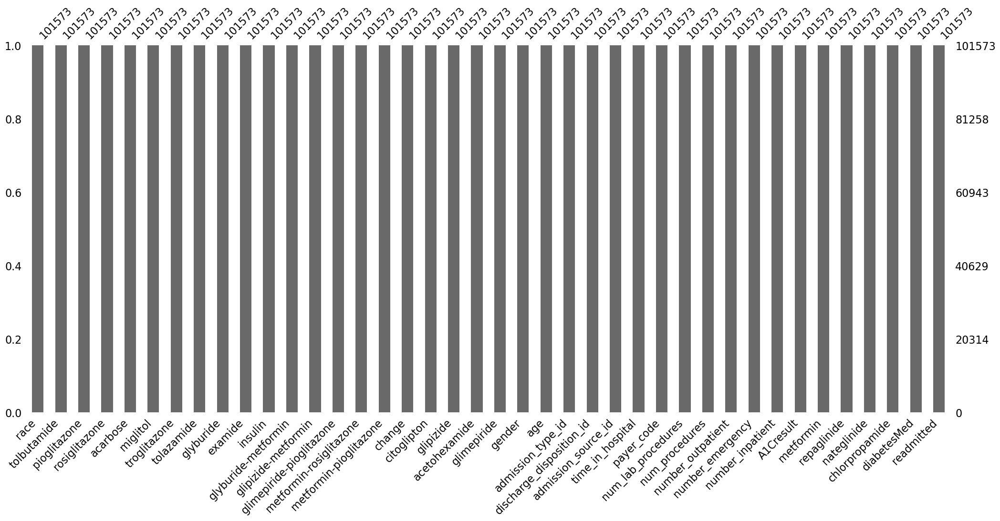

In [341]:
msno.bar(diabetes, sort='ascending')

<Axes: >

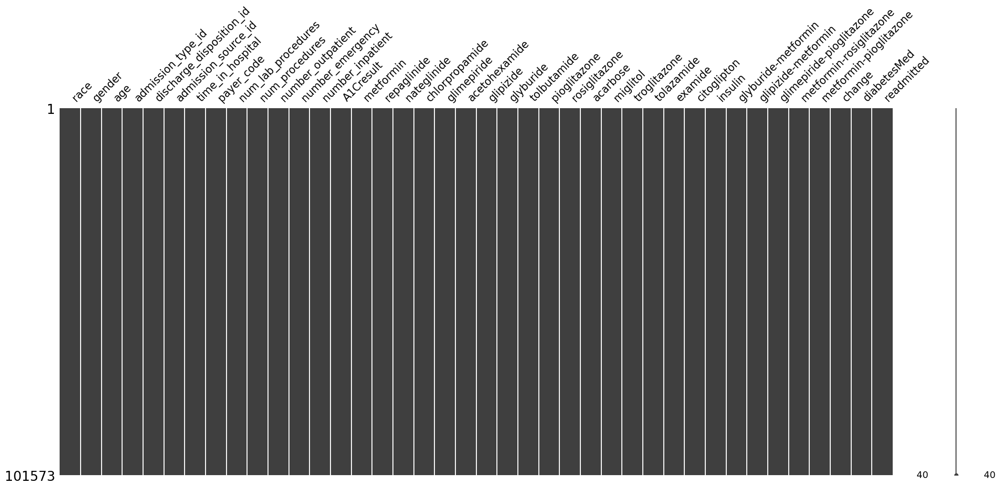

In [342]:
msno.matrix(diabetes)

### CAUTION
admission_type_id, discharge_disposition_id, and admission_source_id all have a number in their IDS map that mean NULL. We need to account for that too.

In [344]:
# Count amt of NULL in admission_type_id, discharge_disposition_id, and admission_source_id
null_codes = {
    'admission_type_id': [5, 6, 8],
    'discharge_disposition_id': [18, 25, 26],
    'admission_source_id': [9, 15, 17, 20, 21]
}

for col, codes in null_codes.items():
    count = diabetes[col].isin(codes).sum()
    total = len(diabetes)
    print(f"{col}: {count} NULL-like entries ({(count/total)*100:.2f}%)")

admission_type_id: 10389 NULL-like entries (10.23%)
discharge_disposition_id: 4665 NULL-like entries (4.59%)
admission_source_id: 7059 NULL-like entries (6.95%)


In [345]:
# Turn all NULL-like values into "Unknown" string
# 5, 6, 8
diabetes['admission_type_id'] = diabetes['admission_type_id'].replace({
    5: 'Unknown', 6: 'Unknown', 8: 'Unknown'
})

# 18, 25, 26
diabetes['discharge_disposition_id'] = diabetes['discharge_disposition_id'].replace({
    18: 'Unknown', 25: 'Unknown', 26: 'Unknown'
})

# 9, 15, 17, 20, 21
diabetes['admission_source_id'] = diabetes['admission_source_id'].replace({
    9: 'Unknown', 15: 'Unknown', 17: 'Unknown', 20: 'Unknown', 21: 'Unknown'
})

In [346]:
# Verify the conversion
for col, codes in null_codes.items():
    count = diabetes[col].isin(codes).sum()
    total = len(diabetes)
    print(f"{col}: {count} NULL-like entries ({(count/total)*100:.2f}%)")

print()
print(diabetes['admission_type_id'].unique())
print(diabetes['discharge_disposition_id'].unique())
print(diabetes['admission_source_id'].unique())

admission_type_id: 0 NULL-like entries (0.00%)
discharge_disposition_id: 0 NULL-like entries (0.00%)
admission_source_id: 0 NULL-like entries (0.00%)

['Unknown' 1 2 3 4 7]
['Unknown' 1 3 6 2 5 11 7 10 4 14 8 13 12 16 17 22 23 9 20 15 24 28 19 27]
[1 7 2 4 5 6 'Unknown' 3 8 14 10 22 11 25 13]


### Keep in Mind for Future
Since we added the string "Unknown" to the admission_type_id, discharge_disposition_id, and admission_source_id, this automatically converts those columns to an object data type. HOWEVER, if the admission_type_id, discharge_disposition_id, and admission_source_id stayed a number data type, they would require conversion to object data type. 

#### Why?
Some numeric type columns are categorical in disguise. For example, although admission_type_id uses numbers, the data are all nominal since the numbers are just labels for categories as shown in the IDS mapping csv file (and do NOT have any real numerical meaning or order). **We need to convert these numerical categories, so they are treated as true categories (int64 to object in this case)** 

On the other hand, columns like time_in_hospital and num_lab_procedures uses true numerical data since the data is related to time and quantity. There is real numerical meaning and order. Thus, we can leave these alone.

**Numeric Categories**
* admission_type_id
* discharge_disposition_id
* admission_source_id

**True Numerics**
* time_in_hospital
* num_lab_procedures
* num_procedures
* num_medications
* number_outpatient
* number_emergency
* number_inpatient
* number_diagnoses


In [348]:
diabetes.info()

<class 'pandas.core.frame.DataFrame'>
Index: 101573 entries, 0 to 101765
Data columns (total 40 columns):
 #   Column                    Non-Null Count   Dtype 
---  ------                    --------------   ----- 
 0   race                      101573 non-null  object
 1   gender                    101573 non-null  object
 2   age                       101573 non-null  object
 3   admission_type_id         101573 non-null  object
 4   discharge_disposition_id  101573 non-null  object
 5   admission_source_id       101573 non-null  object
 6   time_in_hospital          101573 non-null  int64 
 7   payer_code                101573 non-null  object
 8   num_lab_procedures        101573 non-null  int64 
 9   num_procedures            101573 non-null  int64 
 10  number_outpatient         101573 non-null  int64 
 11  number_emergency          101573 non-null  int64 
 12  number_inpatient          101573 non-null  int64 
 13  A1Cresult                 101573 non-null  object
 14  metformin

## Combine NO and >30 together in readmitted column
As mentioned before, the goal of this project is to **identify which data elements have the highest probability of readmitting within 30 days**. Thus, we can fuse NO and >30 together to convert the readmitted column into a binary format.

In [369]:
# Create a working copy of the DataFrame to preserve the original data
copy_diabetes = diabetes.copy()

In [370]:
# Convert <30 to 1 and the remaining to 0
copy_diabetes['readmitted'] = copy_diabetes['readmitted'].apply(lambda x: 1 if x == '<30' else 0)

# Verify conversion
copy_diabetes['readmitted'].unique()

array([0, 1])

**NOTE:** Although 0 and 1 are technically numeric categories — with 1 representing '<30' (readmitted within 30 days) and 0 representing all others — we do not need to convert this column to a category or object type.

This is because readmitted is our target variable, and most machine learning models are designed to handle binary classification problems where the target is encoded as 0 and 1. Models know how to interpret these values correctly without needing further encoding.

In contrast, for feature columns (inputs), numeric values that represent categories — like admission_type_id — need to be explicitly converted to category or object types to avoid being misinterpreted as ordinal or continuous numbers (which leads to bad assumptions).

In [372]:
copy_diabetes.head()

,race,gender,age,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,num_lab_procedures,num_procedures,...,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
0,Caucasian,Female,[0-10),Unknown,Unknown,1,1,Unknown,41,0,...,No,No,No,No,No,No,No,No,No,0
1,Caucasian,Female,[10-20),1,1,7,3,Unknown,59,0,...,No,Up,No,No,No,No,No,Ch,Yes,0
2,AfricanAmerican,Female,[20-30),1,1,7,2,Unknown,11,5,...,No,No,No,No,No,No,No,No,Yes,0
3,Caucasian,Male,[30-40),1,1,7,2,Unknown,44,1,...,No,Up,No,No,No,No,No,Ch,Yes,0
4,Caucasian,Male,[40-50),1,1,7,1,Unknown,51,0,...,No,Steady,No,No,No,No,No,Ch,Yes,0


In [373]:
copy_diabetes.info()

<class 'pandas.core.frame.DataFrame'>
Index: 101573 entries, 0 to 101765
Data columns (total 40 columns):
 #   Column                    Non-Null Count   Dtype 
---  ------                    --------------   ----- 
 0   race                      101573 non-null  object
 1   gender                    101573 non-null  object
 2   age                       101573 non-null  object
 3   admission_type_id         101573 non-null  object
 4   discharge_disposition_id  101573 non-null  object
 5   admission_source_id       101573 non-null  object
 6   time_in_hospital          101573 non-null  int64 
 7   payer_code                101573 non-null  object
 8   num_lab_procedures        101573 non-null  int64 
 9   num_procedures            101573 non-null  int64 
 10  number_outpatient         101573 non-null  int64 
 11  number_emergency          101573 non-null  int64 
 12  number_inpatient          101573 non-null  int64 
 13  A1Cresult                 101573 non-null  object
 14  metformin

# 3) Linear Regression

## Convert Categorical Features into Numeric Features

In [376]:
medications = [
    'repaglinide', 'nateglinide', 'chlorpropamide', 'glimepiride',
    'acetohexamide', 'glipizide', 'glyburide', 'tolbutamide', 'pioglitazone',
    'rosiglitazone', 'acarbose', 'miglitol', 'troglitazone', 'tolazamide',
    'examide', 'citoglipton', 'glyburide-metformin',
    'glipizide-metformin', 'glimepiride-pioglitazone', 'metformin-rosiglitazone',
    'metformin-pioglitazone', 'insulin', 'metformin'
]

# Create 'insulin_only' column - 'No' for those who take more than just insulin
non_insulin = [col for col in medications if col != 'insulin']
copy_diabetes['insulin_only'] = copy_diabetes.apply(
    lambda row: all(row[col] == 'No' for col in non_insulin) and row['insulin'] != 'No',
    axis=1
).astype(int)

# Create triple_therapy col: Whether the patient taking more than 3 diabetic medication 
# (0 = the patient taking less than 3 diabetic medications, 1 = the patient taking more than 3 diabetic meications)
copy_diabetes['triple_therapy'] = copy_diabetes[medications].apply(
    lambda row: sum(val != 'No' for val in row) >= 3,
    axis=1
).astype(int)


# Create a binary column for insulin and metformin
copy_diabetes['insulin_binary'] = (diabetes['insulin'] != 'No').astype(int)
copy_diabetes['metformin_binary'] = (diabetes['metformin'] != 'No').astype(int)

# Drop all meds, except insulin and metformin
copy_diabetes.drop(medications, axis = 1, inplace = True)

In [377]:
# Verify column creations
copy_diabetes.info()

<class 'pandas.core.frame.DataFrame'>
Index: 101573 entries, 0 to 101765
Data columns (total 21 columns):
 #   Column                    Non-Null Count   Dtype 
---  ------                    --------------   ----- 
 0   race                      101573 non-null  object
 1   gender                    101573 non-null  object
 2   age                       101573 non-null  object
 3   admission_type_id         101573 non-null  object
 4   discharge_disposition_id  101573 non-null  object
 5   admission_source_id       101573 non-null  object
 6   time_in_hospital          101573 non-null  int64 
 7   payer_code                101573 non-null  object
 8   num_lab_procedures        101573 non-null  int64 
 9   num_procedures            101573 non-null  int64 
 10  number_outpatient         101573 non-null  int64 
 11  number_emergency          101573 non-null  int64 
 12  number_inpatient          101573 non-null  int64 
 13  A1Cresult                 101573 non-null  object
 14  change   

In [378]:
# Convert categorical features to numeric
copy_diabetes = pd.get_dummies(copy_diabetes, drop_first = False)

In [379]:
# Verify conversion
copy_diabetes.head()

,time_in_hospital,num_lab_procedures,num_procedures,number_outpatient,number_emergency,number_inpatient,readmitted,insulin_only,triple_therapy,insulin_binary,...,payer_code_Unknown,payer_code_WC,A1Cresult_>7,A1Cresult_>8,A1Cresult_Norm,A1Cresult_Unknown,change_Ch,change_No,diabetesMed_No,diabetesMed_Yes
0,1,41,0,0,0,0,0,0,0,0,...,True,False,False,False,False,True,False,True,True,False
1,3,59,0,0,0,0,0,1,0,1,...,True,False,False,False,False,True,True,False,False,True
2,2,11,5,2,0,1,0,0,0,0,...,True,False,False,False,False,True,False,True,False,True
3,2,44,1,0,0,0,0,1,0,1,...,True,False,False,False,False,True,True,False,False,True
4,1,51,0,0,0,0,0,0,0,1,...,True,False,False,False,False,True,True,False,False,True


In [380]:
# Convert "True" and "False" to 1 and 0 
for col in copy_diabetes.select_dtypes(include='bool').columns:
    copy_diabetes[col] = copy_diabetes[col].astype(int)

In [381]:
# Verify conversion
copy_diabetes.head()

,time_in_hospital,num_lab_procedures,num_procedures,number_outpatient,number_emergency,number_inpatient,readmitted,insulin_only,triple_therapy,insulin_binary,...,payer_code_Unknown,payer_code_WC,A1Cresult_>7,A1Cresult_>8,A1Cresult_Norm,A1Cresult_Unknown,change_Ch,change_No,diabetesMed_No,diabetesMed_Yes
0,1,41,0,0,0,0,0,0,0,0,...,1,0,0,0,0,1,0,1,1,0
1,3,59,0,0,0,0,0,1,0,1,...,1,0,0,0,0,1,1,0,0,1
2,2,11,5,2,0,1,0,0,0,0,...,1,0,0,0,0,1,0,1,0,1
3,2,44,1,0,0,0,0,1,0,1,...,1,0,0,0,0,1,1,0,0,1
4,1,51,0,0,0,0,0,0,0,1,...,1,0,0,0,0,1,1,0,0,1


In [382]:
for col in copy_diabetes.columns:
    print(col)

time_in_hospital
num_lab_procedures
num_procedures
number_outpatient
number_emergency
number_inpatient
readmitted
insulin_only
triple_therapy
insulin_binary
metformin_binary
race_AfricanAmerican
race_Asian
race_Caucasian
race_Hispanic
race_Other
race_Unknown
gender_Female
gender_Male
gender_Unknown
age_[0-10)
age_[10-20)
age_[20-30)
age_[30-40)
age_[40-50)
age_[50-60)
age_[60-70)
age_[70-80)
age_[80-90)
age_[90-100)
admission_type_id_1
admission_type_id_2
admission_type_id_3
admission_type_id_4
admission_type_id_7
admission_type_id_Unknown
discharge_disposition_id_1
discharge_disposition_id_2
discharge_disposition_id_3
discharge_disposition_id_4
discharge_disposition_id_5
discharge_disposition_id_6
discharge_disposition_id_7
discharge_disposition_id_8
discharge_disposition_id_9
discharge_disposition_id_10
discharge_disposition_id_11
discharge_disposition_id_12
discharge_disposition_id_13
discharge_disposition_id_14
discharge_disposition_id_15
discharge_disposition_id_16
discharge_dispo

As we can see above, all categorical columns in the DataFrame have been turned into one-hot encoded (binary) columns — one for each category in each feature.

In [384]:
# Check length, which is 102
copy_diabetes.columns

Index(['time_in_hospital', 'num_lab_procedures', 'num_procedures',
       'number_outpatient', 'number_emergency', 'number_inpatient',
       'readmitted', 'insulin_only', 'triple_therapy', 'insulin_binary',
       ...
       'payer_code_Unknown', 'payer_code_WC', 'A1Cresult_>7', 'A1Cresult_>8',
       'A1Cresult_Norm', 'A1Cresult_Unknown', 'change_Ch', 'change_No',
       'diabetesMed_No', 'diabetesMed_Yes'],
      dtype='object', length=102)

## Breaking the data up into Train & Test¶

In [386]:
# Break up data into training (70%), validation (15%), and test data (15%)
train_df, valid_df, test_df = np.split(copy_diabetes.sample(frac=1, random_state=42), 
                                       [int(.7*len(copy_diabetes)), int(0.85*len(copy_diabetes))])
train_df = train_df.reset_index(drop = True)
valid_df = valid_df.reset_index(drop = True)

# Test data is suppose to be unseen data; models seeing this data is basically giving them answers, which can affect model results
test_df = test_df.reset_index(drop = True)

In [387]:
copy_diabetes.readmitted.value_counts()

readmitted
0    90217
1    11356
Name: count, dtype: int64

In [388]:
train_df.readmitted.value_counts()

readmitted
0    63072
1     8029
Name: count, dtype: int64

In [389]:
valid_df.readmitted.value_counts()

readmitted
0    13561
1     1675
Name: count, dtype: int64

In [390]:
test_df.readmitted.value_counts()

readmitted
0    13584
1     1652
Name: count, dtype: int64

## Treating the Imbalance in the Data
Possible Strategies
* Sub-sample the more dominant class
* Over-sample the imbalanced class
* Create synthetic positive data

In [392]:
def calc_prevalence(y_actual):
    
    '''
    This function is to understand the ratio/distribution of the classes that we are going to predict for.
    
    Params:
    1. y_actual: The target feature
    
    Return:
    1. (sum(y_actual)/len(y_actual)): The ratio of the positive class in the complete data.
    '''
    
    return (sum(y_actual)/len(y_actual))

### Over-sampling the imbalanced class

POST MODEL TESTING NOTE: Over-sampling ultimately led to the better model compared to sub-sampling, so we will use this method.

In [395]:
# Split the training data into positive and negative
rows_pos = train_df.readmitted == 1  # People readmitted within 30 days
df_train_pos = train_df.loc[rows_pos]
df_train_neg = train_df.loc[~rows_pos]

# Merge the balanced data 
diabetes_df_balanced = pd.concat([df_train_neg, df_train_pos.sample(n = len(df_train_neg), random_state = 111, replace=True)],axis = 0)

# Shuffle the order of training samples 
diabetes_df_balanced = diabetes_df_balanced.sample(n = len(diabetes_df_balanced), random_state = 42).reset_index(drop = True)

print('Train balanced prevalence(n = %d):%.3f'%(len(diabetes_df_balanced), \
                                                calc_prevalence(diabetes_df_balanced.readmitted.values)))

Train balanced prevalence(n = 126144):0.500


In [396]:
diabetes_df_balanced.readmitted.value_counts()

readmitted
0    63072
1    63072
Name: count, dtype: int64

In [397]:
x_train = diabetes_df_balanced.drop('readmitted', axis=1)

y_train = diabetes_df_balanced['readmitted']

x_valid = valid_df.drop('readmitted', axis=1)

y_valid = valid_df['readmitted']

x_test = test_df.drop('readmitted', axis=1)

y_test = test_df['readmitted']

In [398]:
scaler=StandardScaler()
x_train[numerical] = pd.DataFrame(scaler.fit_transform(x_train[numerical]),columns=numerical)
x_valid[numerical] = pd.DataFrame(scaler.transform(x_valid[numerical]),columns=numerical)
x_test[numerical] = pd.DataFrame(scaler.transform(x_test[numerical]),columns=numerical)

In [399]:
def calc_specificity(y_actual, y_pred, thresh):
    # calculates specificity
    return sum((y_pred < thresh) & (y_actual == 0)) /sum(y_actual ==0)

def print_report(y_actual, y_pred, thresh = 0.5):
    
    '''
    This function calculates all the metrics to assess the machine learning models.
    
    Params:
    1. y_actual: The actual values for the target variable.
    2. y_pred: The predicted values for the target variable.
    3. thresh: The threshold for the probability to be considered as a positive class. Default value 0.5
    
    Return:
    1. AUC
    2. Accuracy
    3. Recall
    4. Precision
    5. Specificity
    '''
    
    auc = roc_auc_score(y_actual, y_pred)
    accuracy = accuracy_score(y_actual, (y_pred > thresh))
    recall = recall_score(y_actual, (y_pred > thresh))
    precision = precision_score(y_actual, (y_pred > thresh))
    specificity = calc_specificity(y_actual, y_pred, thresh)
    print('AUC:%.3f'%auc)
    print('accuracy:%.3f'%accuracy)
    print('recall:%.3f'%recall)
    print('precision:%.3f'%precision)
    print('specificity:%.3f'%specificity)
    print('prevalence:%.3f'%calc_prevalence(y_actual))
    print(' ')
    return auc, accuracy, recall, precision, specificity

### Logistic Regression (for over-sampling imbalanced class)
Logistic regression is used to predict categorical variables while linear regression is used to predict numerical variables. Hence, we will use logistic regression since we are working with binary classification. 

In [401]:
lr=LogisticRegression(random_state = 42, solver = 'newton-cg', max_iter = 200)
lr.fit(x_train, y_train)

y_valid_preds = lr.predict_proba(x_valid)[:,1]

print('Metrics for Validation data:')

lr_valid_auc, lr_valid_accuracy, lr_valid_recall, \
    lr_valid_precision, lr_valid_specificity = print_report(y_valid,y_valid_preds, 0.5)

Metrics for Validation data:
AUC:0.686
accuracy:0.684
recall:0.579
precision:0.191
specificity:0.697
prevalence:0.110
 


## Decision Tree Model

In [403]:
dc_clf = DecisionTreeClassifier(random_state=42, max_depth = 10)
dc_clf.fit(x_train, y_train)

dc_preds_proba = dc_clf.predict_proba(x_valid)[:,1]
dc_preds = dc_clf.predict(x_valid)

lr_valid_auc, lr_valid_accuracy, lr_valid_recall, \
    lr_valid_precision, lr_valid_specificity = print_report(y_valid,dc_preds_proba, 0.5)

AUC:0.659
accuracy:0.646
recall:0.584
precision:0.173
specificity:0.654
prevalence:0.110
 


## Random Forest

In [432]:
rf_clf = RandomForestClassifier(random_state=111, max_depth = 6, class_weight='balanced')
# rf_clf = RandomForestClassifier(random_state=111, max_depth = 6, class_weight='balanced_subsample')

rf_clf.fit(x_train, y_train)

rf_preds = rf_clf.predict(x_valid)
rf_preds_proba = rf_clf.predict_proba(x_valid)[:, 1]

lr_valid_auc, lr_valid_accuracy, lr_valid_recall, \
    lr_valid_precision, lr_valid_specificity = print_report(y_valid,rf_preds_proba, 0.5)

AUC:0.687
accuracy:0.634
recall:0.641
precision:0.177
specificity:0.633
prevalence:0.110
 


## KNN Model

In [434]:
knn = KNeighborsClassifier(n_neighbors = 100)
knn.fit(x_train, y_train)

knn_preds = knn.predict_proba(x_valid)[:,1]

lr_valid_auc, lr_valid_accuracy, lr_valid_recall, \
    lr_valid_precision, lr_valid_specificity = print_report(y_valid,knn_preds, 0.5)

AUC:0.633
accuracy:0.644
recall:0.545
precision:0.164
specificity:0.629
prevalence:0.110
 


## Linear SVC

In [436]:
lsvc_clf = LinearSVC(random_state=111)
lsvc_clf.fit(x_train, y_train)

lsvc_preds = lsvc_clf.decision_function(x_valid)

lr_valid_auc, lr_valid_accuracy, lr_valid_recall, \
    lr_valid_precision, lr_valid_specificity = print_report(y_valid,lsvc_preds, 0.5)

AUC:0.684
accuracy:0.882
recall:0.109
precision:0.373
specificity:0.977
prevalence:0.110
 


## Gradient Boosting Model

In [438]:
gb_clf = GradientBoostingClassifier(n_estimators = 100, criterion='friedman_mse', learning_rate = 1.0, max_depth = 3,\
                                    random_state = 111)

gb_clf.fit(x_train, y_train)
gb_preds = gb_clf.predict(x_valid)
gb_preds_proba = gb_clf.predict_proba(x_valid)[:, 1]

lr_valid_auc, lr_valid_accuracy, lr_valid_recall, \
    lr_valid_precision, lr_valid_specificity = print_report(y_valid,gb_preds_proba, 0.5)

AUC:0.666
accuracy:0.657
recall:0.580
precision:0.177
specificity:0.667
prevalence:0.110
 


## Catboost Model

In [440]:
catb=CatBoostClassifier(iterations=200, depth=3, learning_rate=1.0, random_state = 111)
catb.fit(x_train, y_train)
catb_preds = catb.predict_proba(x_valid)[:, 1]

lr_valid_auc, lr_valid_accuracy, lr_valid_recall, \
    lr_valid_precision, lr_valid_specificity = print_report(y_valid,catb_preds, 0.5)

0:	learn: 0.6624218	total: 98.6ms	remaining: 19.6s
1:	learn: 0.6561552	total: 114ms	remaining: 11.3s
2:	learn: 0.6529957	total: 130ms	remaining: 8.56s
3:	learn: 0.6510538	total: 144ms	remaining: 7.05s
4:	learn: 0.6499387	total: 159ms	remaining: 6.21s
5:	learn: 0.6484990	total: 174ms	remaining: 5.63s
6:	learn: 0.6475401	total: 198ms	remaining: 5.45s
7:	learn: 0.6467813	total: 218ms	remaining: 5.22s
8:	learn: 0.6461987	total: 233ms	remaining: 4.93s
9:	learn: 0.6456622	total: 257ms	remaining: 4.89s
10:	learn: 0.6451129	total: 355ms	remaining: 6.11s
11:	learn: 0.6446198	total: 392ms	remaining: 6.14s
12:	learn: 0.6440921	total: 499ms	remaining: 7.18s
13:	learn: 0.6430631	total: 570ms	remaining: 7.58s
14:	learn: 0.6424015	total: 617ms	remaining: 7.6s
15:	learn: 0.6415610	total: 655ms	remaining: 7.53s
16:	learn: 0.6409005	total: 687ms	remaining: 7.4s
17:	learn: 0.6401515	total: 709ms	remaining: 7.17s
18:	learn: 0.6396049	total: 836ms	remaining: 7.96s
19:	learn: 0.6390155	total: 884ms	remainin

## Stochastic Gradient Descent Model

In [442]:
sgdc=SGDClassifier(loss = 'log_loss',alpha = 0.1,random_state = 42)
sgdc.fit(x_train, y_train)

sgd_preds = sgdc.predict_proba(x_valid)[:,1]

print('Stochastic Gradient Descent')
print('Validation:')
sgdc_valid_auc, sgdc_valid_accuracy, sgdc_valid_recall, \
                sgdc_valid_precision, sgdc_valid_specificity = print_report(y_valid,sgd_preds, 0.5)

Stochastic Gradient Descent
Validation:
AUC:0.662
accuracy:0.684
recall:0.528
precision:0.180
specificity:0.703
prevalence:0.110
 


## XGB Model

In [444]:
# Remove certain special characters (e.g. brackets and less than sign) as  XGB model will not work with them
x_train.columns = x_train.columns.str.replace('[\[\]<>()]', '', regex=True)
x_valid.columns = x_valid.columns.str.replace('[\[\]<>()]', '', regex=True)
x_test.columns = x_test.columns.str.replace('[\[\]<>()]', '', regex=True)

In [445]:
xgb_clf = xgb.XGBClassifier(max_depth=3, learning_rate = 1.0, use_label_encoder = False,\
                            eval_metric = 'logloss')
xgb_clf.fit(x_train, y_train)

xgb_preds = xgb_clf.predict(x_valid)
xgb_preds_proba = xgb_clf.predict_proba(x_valid)[:, 1]

lr_valid_auc, lr_valid_accuracy, lr_valid_recall, \
    lr_valid_precision, lr_valid_specificity = print_report(y_valid,xgb_preds_proba, 0.5)

AUC:0.658
accuracy:0.654
recall:0.554
precision:0.170
specificity:0.666
prevalence:0.110
 


# Hyperparameter Tuning
## Top 3 AUC Models
1. Random Forest
2. Logistic Regression
3. Linear SVC (Has a very low recall and precision though)

In [447]:
recall_scoring = make_scorer(recall_score)

## Random Forest - Hyper Parameter Tuning

In [449]:
rf = RandomForestClassifier(
    n_estimators=500,
    max_depth=10,
    min_samples_split=5,
    criterion='gini',
    class_weight='balanced',
    random_state=42
)
rf.fit(x_train, y_train)
y_pred_proba = rf.predict_proba(x_valid)[:, 1]

print_report(y_valid, y_pred_proba, 0.5)

AUC:0.691
accuracy:0.656
recall:0.619
precision:0.184
specificity:0.660
prevalence:0.110
 


(0.6910057484863861,
 0.6558151745865056,
 0.6191044776119403,
 0.18376749955697325,
 0.6603495317454465)

In [451]:
rf = RandomForestClassifier(
    n_estimators=300,
    max_depth=11,
    min_samples_split=10,
    # criterion='gini',
    class_weight='balanced_subsample',
    random_state=42,
    min_samples_leaf=4
)
rf.fit(x_train, y_train)
y_pred_proba = rf.predict_proba(x_valid)[:, 1]

print_report(y_valid, y_pred_proba, 0.5)

AUC:0.692
accuracy:0.667
recall:0.610
precision:0.188
specificity:0.674
prevalence:0.110
 


(0.691939219909596,
 0.6666447886584406,
 0.6101492537313433,
 0.18759177679882524,
 0.6736228891674655)

### Random Forest - Top 10 Feature Importance

                        Feature  Importance
5              number_inpatient    0.267138
35   discharge_disposition_id_1    0.067800
45  discharge_disposition_id_11    0.061320
4              number_emergency    0.057547
1            num_lab_procedures    0.052183
0              time_in_hospital    0.049236
54  discharge_disposition_id_22    0.046870
2                num_procedures    0.023060
3             number_outpatient    0.020707
37   discharge_disposition_id_3    0.018649


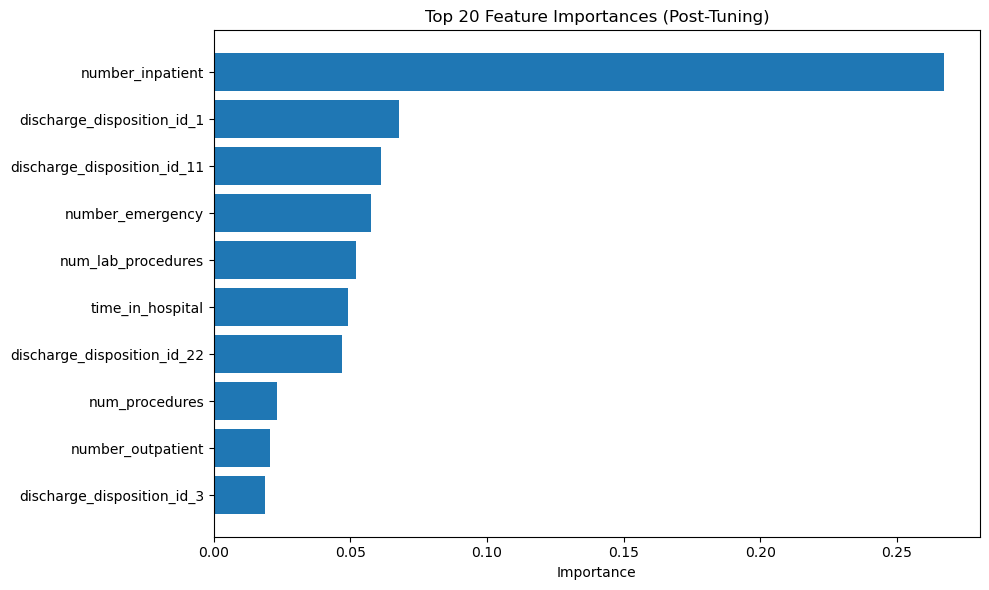

In [457]:
# 1. Get feature importances
importances = rf.feature_importances_
feature_names = x_train.columns

# 2. Create a DataFrame
feature_imp_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

# 3. View top features
print(feature_imp_df.head(10))

# 4. Plot (optional but recommended)
plt.figure(figsize=(10, 6))
plt.barh(feature_imp_df['Feature'].head(10)[::-1], feature_imp_df['Importance'].head(10)[::-1])
plt.xlabel("Importance")
plt.title("Top 20 Feature Importances (Post-Tuning)")
plt.tight_layout()
plt.show()

# --- TESTING ---

In [487]:
for n in [200, 300, 400, 500, 600]:
    rf = RandomForestClassifier(
        n_estimators=n,
        random_state=42,
        class_weight='balanced',
        max_depth=10,
        min_samples_split=10
    )
    rf.fit(x_train, y_train)
    y_pred_prob = rf.predict_proba(x_valid)[:, 1]
    auc = roc_auc_score(y_valid, y_pred_prob)
    print(f'n_estimators = {n} → AUC = {auc:.4f}')

# 1st Test: [100, 200, 300, 400, 500] --> 500 BEST
    # n_estimators = 400 → AUC = 0.6748
    # n_estimators = 500 → AUC = 0.6749
# 2nd Test: [600, 700]
    # 600 is also 0.6749, so plateau at 500

n_estimators = 200 → AUC = 0.6915
n_estimators = 300 → AUC = 0.6916
n_estimators = 400 → AUC = 0.6915
n_estimators = 500 → AUC = 0.6916
n_estimators = 600 → AUC = 0.6916


In [488]:
for d in [3, 5, 7, 9, 10, 11]:
    rf = RandomForestClassifier(
        n_estimators=200,
        max_depth=d,
        random_state=42,
        class_weight='balanced',
        min_samples_split=10
    )
    rf.fit(x_train, y_train)
    y_pred_prob = rf.predict_proba(x_valid)[:, 1]
    auc = roc_auc_score(y_valid, y_pred_prob)
    print(f'max_depth = {d} → AUC = {auc:.4f}')

# Plateau at 10 as 11 was worse

max_depth = 3 → AUC = 0.6811
max_depth = 5 → AUC = 0.6848
max_depth = 7 → AUC = 0.6883
max_depth = 9 → AUC = 0.6906
max_depth = 11 → AUC = 0.6919


In [489]:
for d in [3, 5, 7, 9, 10]:
    rf = RandomForestClassifier(
        n_estimators=500,
        max_depth=d,
        random_state=42,
        class_weight='balanced',
        min_samples_split=10
    )
    rf.fit(x_train, y_train)
    y_pred_prob = rf.predict_proba(x_valid)[:, 1]
    auc = roc_auc_score(y_valid, y_pred_prob)
    print(f'max_depth = {d} → AUC = {auc:.4f}')


# Plateau at 10 as 11 was worse

max_depth = 3 → AUC = 0.6822
max_depth = 5 → AUC = 0.6852
max_depth = 7 → AUC = 0.6887
max_depth = 9 → AUC = 0.6909
max_depth = 10 → AUC = 0.6916


In [490]:
for split in [2, 5, 10, 15, 20]:
    rf = RandomForestClassifier(
        n_estimators=500,
        max_depth=10,
        min_samples_split=split,
        class_weight='balanced',
        random_state=42
    )
    rf.fit(x_train, y_train)
    y_pred_prob = rf.predict_proba(x_valid)[:, 1]
    auc = roc_auc_score(y_valid, y_pred_prob)
    print(f'min_samples_split = {split} → AUC = {auc:.4f}')

# Plateau at 2

min_samples_split = 2 → AUC = 0.6912
min_samples_split = 5 → AUC = 0.6910
min_samples_split = 10 → AUC = 0.6916
min_samples_split = 15 → AUC = 0.6912
min_samples_split = 20 → AUC = 0.6909


In [491]:
for crit in ['gini', 'entropy']:
    rf = RandomForestClassifier(
        n_estimators=500,
        max_depth=10,
        min_samples_split=2,
        criterion=crit,
        class_weight='balanced',
        random_state=42
    )
    rf.fit(x_train, y_train)
    y_pred_prob = rf.predict_proba(x_valid)[:, 1]
    auc = roc_auc_score(y_valid, y_pred_prob)
    print(f'criterion = {crit} → AUC = {auc:.4f}')

# gini is better

criterion = gini → AUC = 0.6912
criterion = entropy → AUC = 0.6910


In [492]:
for feat in ['sqrt', 'log2']:
    rf = RandomForestClassifier(
        n_estimators=500,
        max_depth=10,
        min_samples_split=2,
        criterion='gini',
        class_weight='balanced',
        random_state=42,
        max_features=feat
    )
    rf.fit(x_train, y_train)
    y_pred_prob = rf.predict_proba(x_valid)[:, 1]
    auc = roc_auc_score(y_valid, y_pred_prob)
    print(f'feature = {feat} → AUC = {auc:.4f}')

feature = sqrt → AUC = 0.6912
feature = log2 → AUC = 0.6899


In [493]:
for leaf in [2, 3, 4, 5]:
    rf = RandomForestClassifier(
        n_estimators=500,
        max_depth=10,
        min_samples_split=2,
        criterion='gini',
        class_weight='balanced',
        random_state=42,
        min_samples_leaf=leaf
    )
    rf.fit(x_train, y_train)
    y_pred_prob = rf.predict_proba(x_valid)[:, 1]
    auc = roc_auc_score(y_valid, y_pred_prob)
    print(f'min_samples_leaf = {leaf} → AUC = {auc:.4f}')


# min_samples_leaf = 4 → AUC = 0.6919
# Plateaus at 4 

min_samples_leaf = 2 → AUC = 0.6907
min_samples_leaf = 3 → AUC = 0.6914
min_samples_leaf = 4 → AUC = 0.6919
min_samples_leaf = 5 → AUC = 0.6915


In [481]:
for weight in ['balanced', 'balanced_subsample']:
    rf = RandomForestClassifier(
        n_estimators=500,
        max_depth=10,
        min_samples_split=2,
        criterion='gini',
        class_weight=weight,
        random_state=42
    )
    rf.fit(x_train, y_train)
    y_pred_prob = rf.predict_proba(x_valid)[:, 1]
    auc = roc_auc_score(y_valid, y_pred_prob)
    print(f'class_weight = {weight} → weight = {auc:.4f}')

class_weight = balanced → weight = 0.6912
class_weight = balanced_subsample → weight = 0.6914
